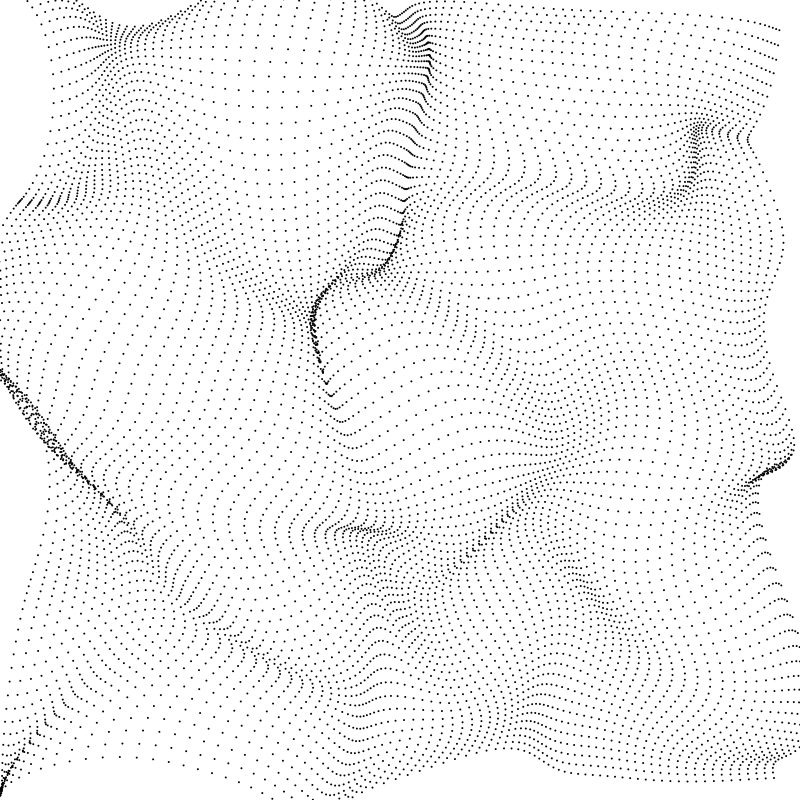

In [3]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 200.0
x_tick = d.height / grid_divisions
y_tick = d.width / grid_divisions

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[4,4,2], 
)
# noise = (noise + 1.0) / 2.0

for x in range(padding,grid_divisions-padding):
    for y in range(padding,grid_divisions-padding):
        c = draw.Circle(
            x * x_tick + noise[x][y][0]*noise_scaler, 
            y * y_tick + noise[x][y][1]*noise_scaler, 
            radius,
            fill='black', 
            # fill_opacity=0.0,
            stroke_width=0, 
            stroke='black')
        d.append(c)
         
# Display in Jupyter notebook
d.rasterize()  
d

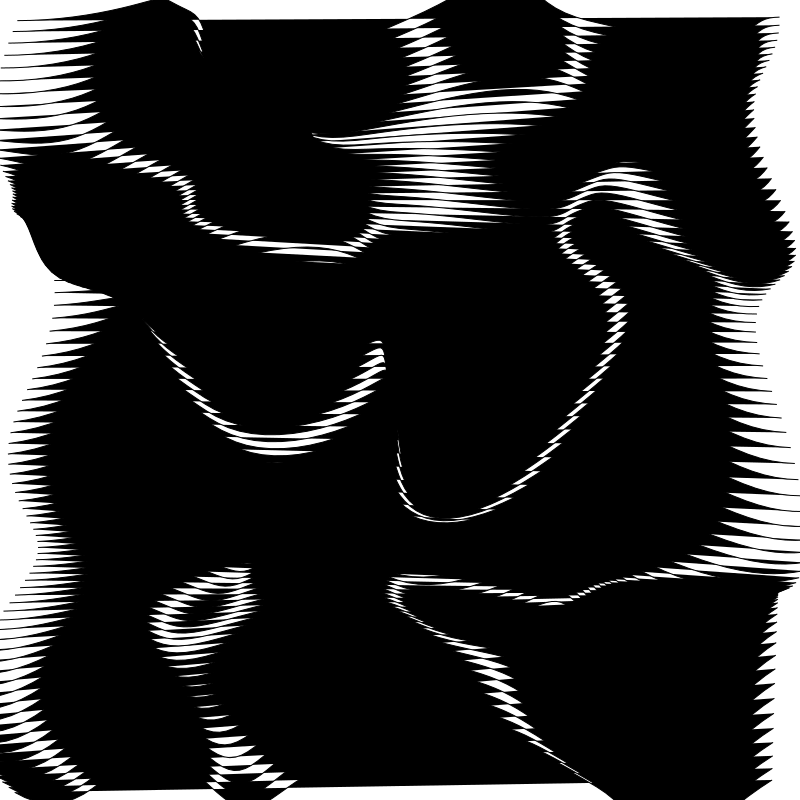

In [76]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 200.0
x_tick = d.height / grid_divisions
y_tick = d.width / grid_divisions

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[4,4,2], 
)
# noise = (noise + 1.0) / 2.0

columns = grid_divisions
rows = grid_divisions
for y in range(padding,rows-padding):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            x * x_tick + noise[x][y][0]*noise_scaler, 
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    d.append(draw.Lines(
        *points,
        fill='black', 
        # fill_opacity=0.0,
        stroke_width=1, 
        stroke='black'
    ))

# Display in Jupyter notebook
d.rasterize()  
d

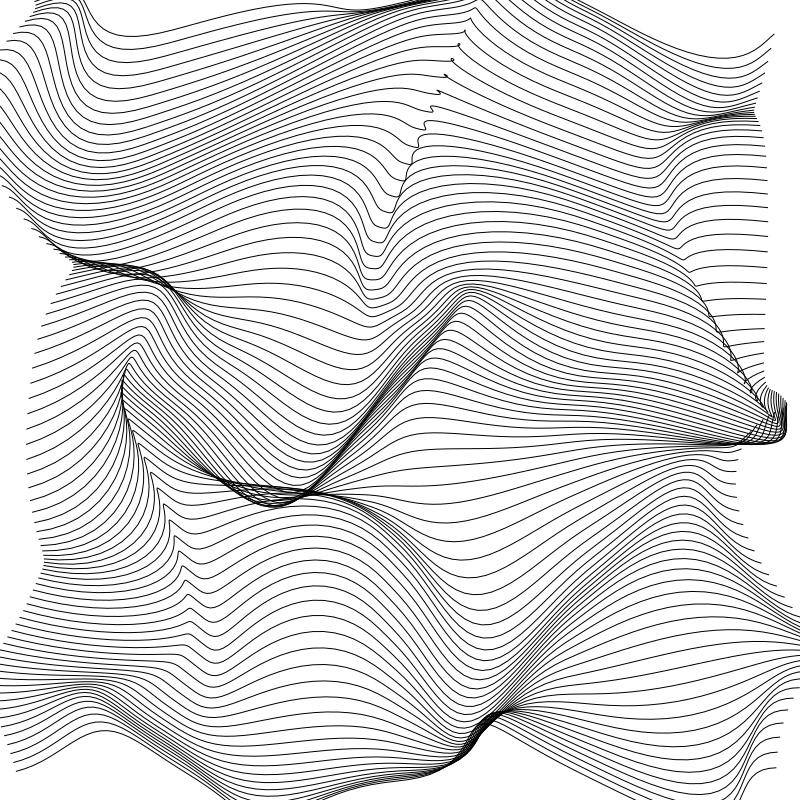

In [77]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 200.0
x_tick = d.height / grid_divisions
y_tick = d.width / grid_divisions

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[4,4,2], 
)
# noise = (noise + 1.0) / 2.0

columns = grid_divisions
rows = grid_divisions
for y in range(padding,rows-padding):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            x * x_tick + noise[x][y][0]*noise_scaler, 
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    d.append(draw.Lines(
        *points,
        fill='black', 
        fill_opacity=0.0,
        stroke_width=1, 
        stroke='black'
    ))

# Display in Jupyter notebook
d.rasterize()  
d

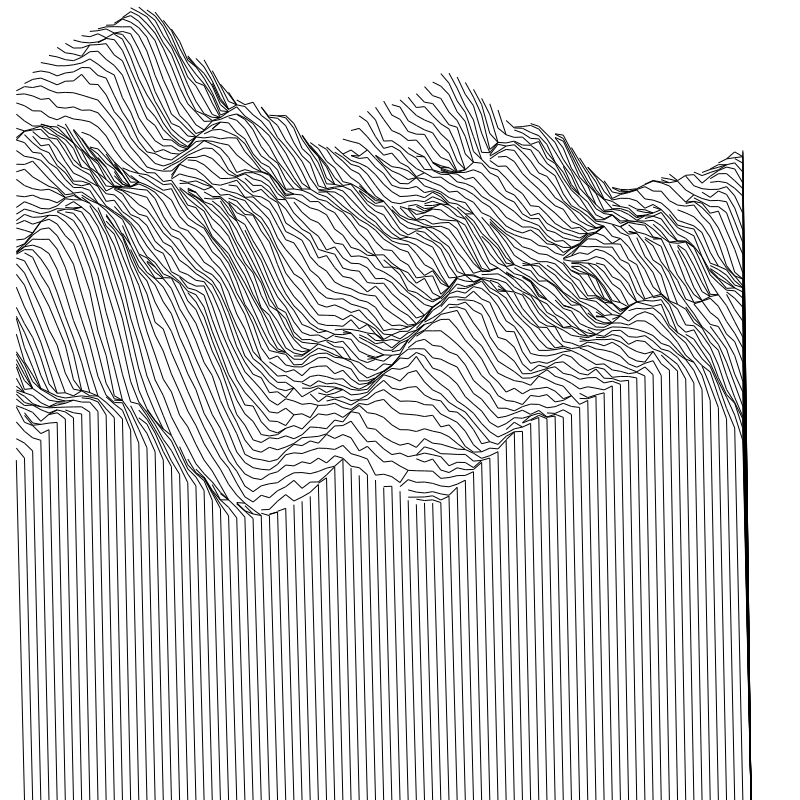

In [4]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[2,4,2], 
)
noise = (noise + 1.0) / 2.0
noise= noise **3
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[4,4,2], 
) / 5
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[8,8,2], 
) / 10
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[16,16,2], 
) / 50
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[32,32,2], 
) / 50
noise += generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[48,48,2], 
) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,rows-padding,1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] <= mins[x]:
            mins[x] = points[x]
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=mins[x],
                ex=(x+1) * x_tick,
                ey=mins[x+1],
                # ey=y*y_tick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
        
    # t = np.arange(len(points))
    # ti = np.linspace(0, t.max(), t.size)
    # points = interp1d(t, points, kind='cubic')(ti)
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d.save_svg("pinstripe.svg")
d

In [258]:
# !{sys.executable} -m pip install scipy

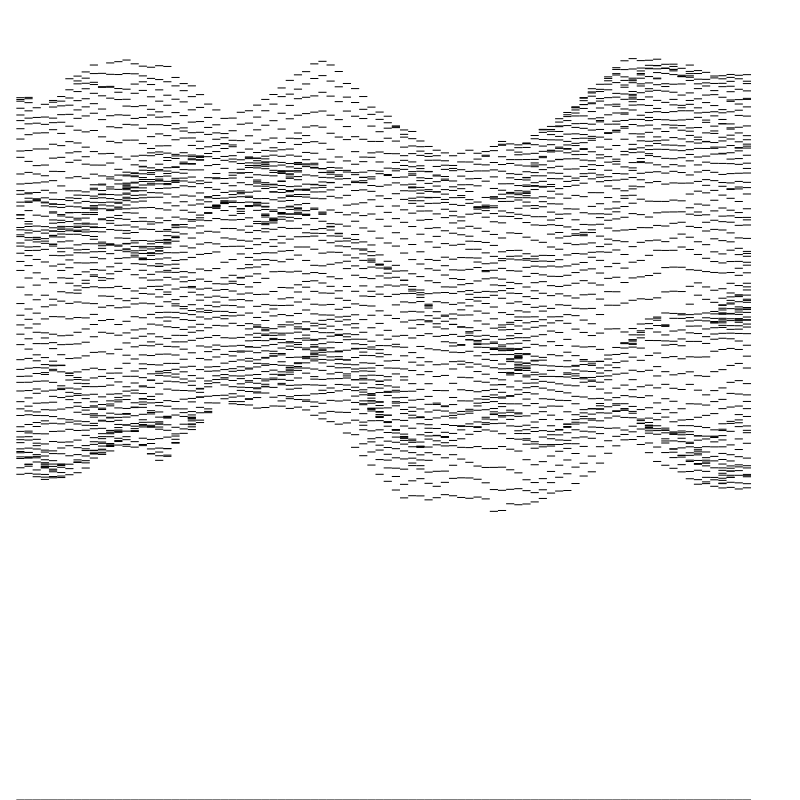

In [338]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[2,4,2], 
)
noise = (noise + 1.0) / 2.0
noise= noise **3
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[4,4,2], 
) / 5
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[8,8,2], 
) / 10
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[16,16,2], 
) / 50
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[32,32,2], 
) / 50
noise += generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[48,48,2], 
) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,rows-padding,1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=mins[x],
                ex=(x+1) * x_tick,
                ey=mins[x],
                # ey=y*y_tick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

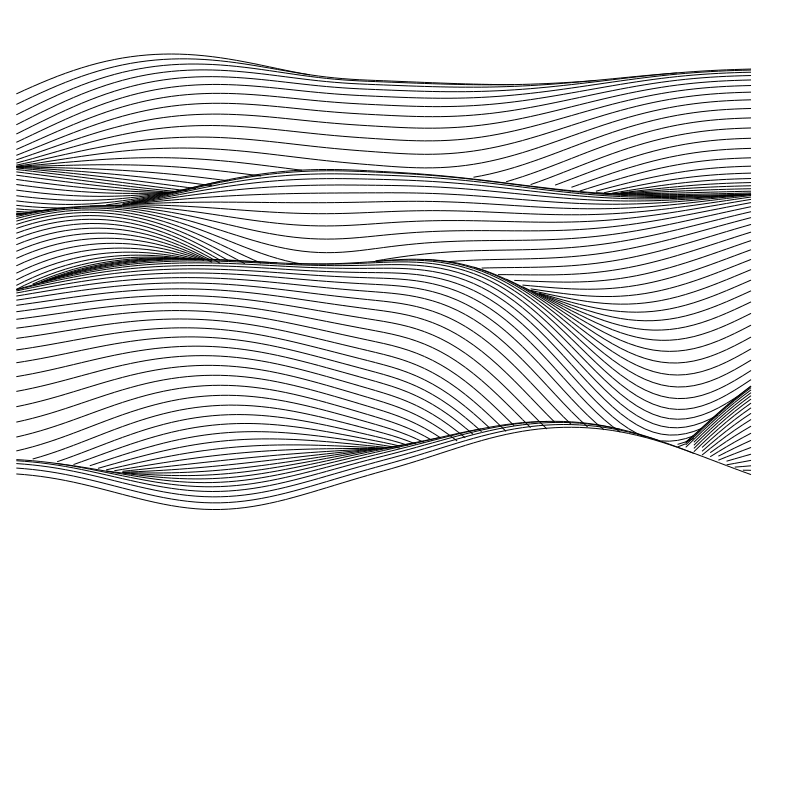

In [344]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, grid_divisions-padding, 2], 
    res=[2,4,2], 
)
noise = (noise + 1.0) / 2.0
noise= noise **3
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[4,4,2], 
# ) / 5
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[8,8,2], 
# ) / 10
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[16,16,2], 
# ) / 50
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[32,32,2], 
# ) / 50
# noise += generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[48,48,2], 
# ) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,rows-padding,1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

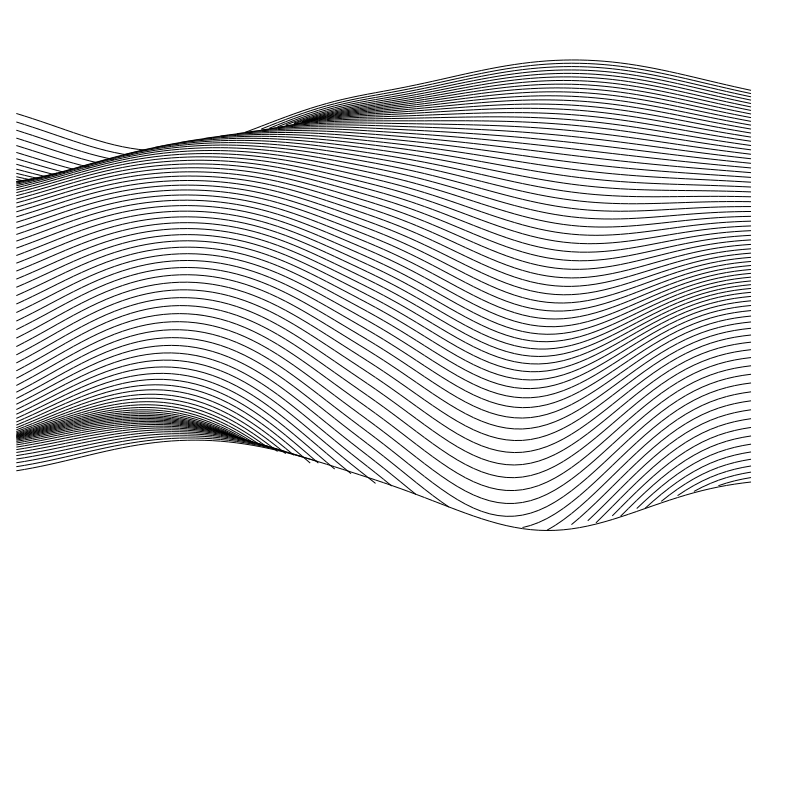

In [348]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[2,4,2], 
)
noise = (noise + 1.0) / 2.0
noise= noise **3
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[4,4,2], 
# ) / 5
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[8,8,2], 
# ) / 10
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[16,16,2], 
# ) / 50
# noise +=  generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[32,32,2], 
# ) / 50
# noise += generate_perlin_noise_3d(
#     shape=[grid_divisions-padding, grid_divisions-padding, 2], 
#     res=[48,48,2], 
# ) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,rows-padding,1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

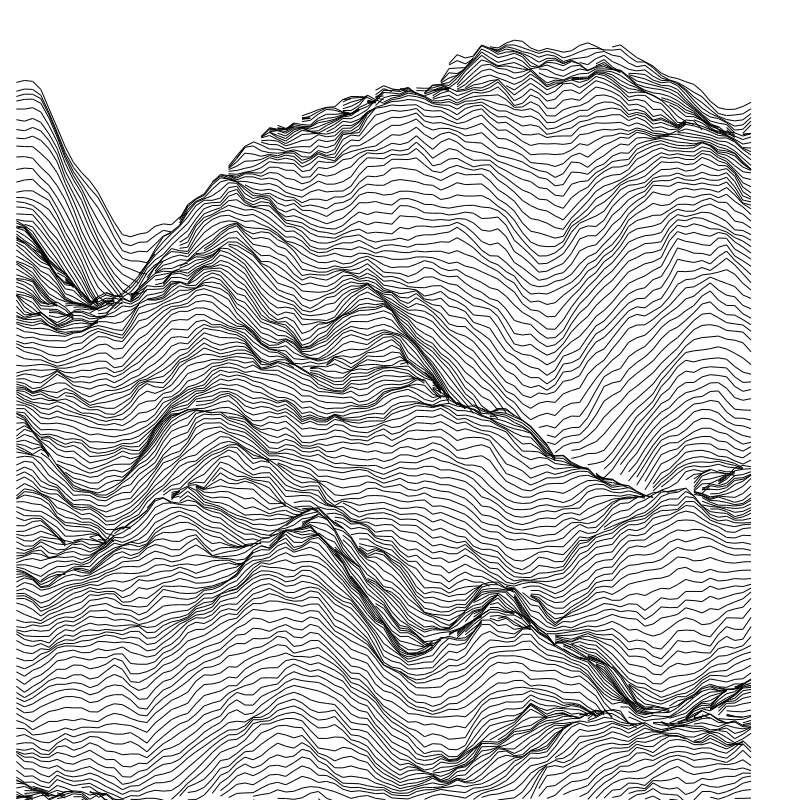

In [351]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[2,4,2], 
)
noise = (noise + 1.0) / 2.0
noise= noise **3
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[4,4,2], 
) / 5
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[8,8,2], 
) / 10
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[16,16,2], 
) / 50
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    res=[32,32,2], 
) / 50
noise += generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    res=[48,48,2], 
) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

In [52]:
# !mkdir smooth_waves

In [58]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d
import numpy as np

for i in range(200,300):
    d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

    radius = 1
    padding = 2
    grid_divisions = 98
    noise_scaler = 700.0
    x_tick = d.height / grid_divisions
    y_tick = d.width / (grid_divisions *2)

    noise = generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[2,4,2], 
    )
    noise = (noise + 1.0) / 2.0
    noise= noise **3
    noise +=  generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[4,4,2], 
    ) / 5
    # noise +=  generate_perlin_noise_3d(
    #     shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    #     res=[8,8,2], 
    # ) / 10
    # noise +=  generate_perlin_noise_3d(
    #     shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    #     res=[16,16,2], 
    # ) / 50
    # noise +=  generate_perlin_noise_3d(
    #     shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    #     res=[32,32,2], 
    # ) / 50
    # noise += generate_perlin_noise_3d(
    #     shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    #     res=[48,48,2], 
    # ) /50


    columns = grid_divisions
    rows = grid_divisions
    mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
    for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
        points = []
        for x in range(padding,columns-padding):
            points.extend([
                # x * x_tick,
                y * y_tick + noise[x][y][1]*noise_scaler,
            ])
        t = np.arange(len(points))
        ti = np.linspace(0, t.max(), t.size)
        points = interp1d(t, points, kind='cubic')(ti)
        for x in range(padding,columns-(2*padding)-2):
            # print(x, columns-(2*padding)-1, len(mins))
            if points[x] < mins[x]:
                d.append(draw.Line(
                    sx=x * x_tick,
                    # sy=y*y_tick,
                    sy=points[x],
                    ex=(x+1) * x_tick,
                    ey=points[x+1],
                    # ey=y*y_t+1ick,
                    fill='black', 
                    fill_opacity=0.0,
                    stroke_width=1, 
                    stroke='black'
                ))
                mins[x] = points[x]
            elif points[x+1] < mins[x+1]:
                d.append(draw.Line(
                    sx=x * x_tick,
                    # sy=y*y_tick,
                    sy=mins[x],
                    ex=(x+1) * x_tick,
                    ey=points[x+1],
                    # ey=y*y_t+1ick,
                    fill='black', 
                    fill_opacity=0.0,
                    stroke_width=1, 
                    stroke='black'
                ))

        # print(np.array(list(range(0,len(points),2))))
        # print(np.array(list(range(1,len(points),2))))
        # print(points[np.array(list(range(0,len(points),2)))])
    #     for i, evens in enumerate(range(1,len(points),2)):
    #         if points[evens] < mins[i]:
    #             mins[i] = points[evens]
    #         else:
    #             #don't draw
    #             pass
    #         print(i, evens)


    #     for i in range()
        # break

    # Display in Jupyter notebook
    # d.rasterize()  
    d.save_svg(f"smooth_waves/smooth_waves{i}.svg")
    d.save_png(f"smooth_waves/smooth_waves{i}.png")
    # d

In [55]:
!mkdir rough_waves

In [56]:
import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d

for i in range(0,100):

    d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

    radius = 1
    padding = 2
    grid_divisions = 98
    noise_scaler = 700.0
    x_tick = d.height / grid_divisions
    y_tick = d.width / (grid_divisions *2)

    noise = generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[2,4,2], 
    ) 
    noise = (noise + 1.0) / 2.0
    noise= noise **3
    noise +=  generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[4,4,2], 
    ) / 50
    noise +=  generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[8,8,2], 
    ) / 20
    noise +=  generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[16,16,2], 
    ) / 50
    noise +=  generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
        res=[24,24,2], 
    ) / 100
    # noise +=  generate_perlin_noise_3d(
    #     shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    #     res=[32,32,2], 
    # ) / 50
    noise += generate_perlin_noise_3d(
        shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
        res=[48,48,2], 
    ) /100


    columns = grid_divisions
    rows = grid_divisions
    mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
    for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
        points = []
        for x in range(padding,columns-padding):
            points.extend([
                # x * x_tick,
                y * y_tick + noise[x][y][1]*noise_scaler,
            ])
        t = np.arange(len(points))
        ti = np.linspace(0, t.max(), t.size)
        points = interp1d(t, points, kind='cubic')(ti)
        for x in range(padding,columns-(2*padding)-2):
            # print(x, columns-(2*padding)-1, len(mins))
            if points[x] < mins[x]:
                d.append(draw.Line(
                    sx=x * x_tick,
                    # sy=y*y_tick,
                    sy=points[x],
                    ex=(x+1) * x_tick,
                    ey=points[x+1],
                    # ey=y*y_t+1ick,
                    fill='black', 
                    fill_opacity=0.0,
                    stroke_width=1, 
                    stroke='black'
                ))
                mins[x] = points[x]
            elif points[x+1] < mins[x+1]:
                d.append(draw.Line(
                    sx=x * x_tick,
                    # sy=y*y_tick,
                    sy=mins[x],
                    ex=(x+1) * x_tick,
                    ey=points[x+1],
                    # ey=y*y_t+1ick,
                    fill='black', 
                    fill_opacity=0.0,
                    stroke_width=1, 
                    stroke='black'
                ))

        # print(np.array(list(range(0,len(points),2))))
        # print(np.array(list(range(1,len(points),2))))
        # print(points[np.array(list(range(0,len(points),2)))])
    #     for i, evens in enumerate(range(1,len(points),2)):
    #         if points[evens] < mins[i]:
    #             mins[i] = points[evens]
    #         else:
    #             #don't draw
    #             pass
    #         print(i, evens)


    #     for i in range()
        # break

    d.save_svg(f"rough_waves/rough_waves{i}.svg")
    d.save_png(f"rough_waves/rough_waves{i}.png")
    # Display in Jupyter notebook
    # d.rasterize()  
    # d

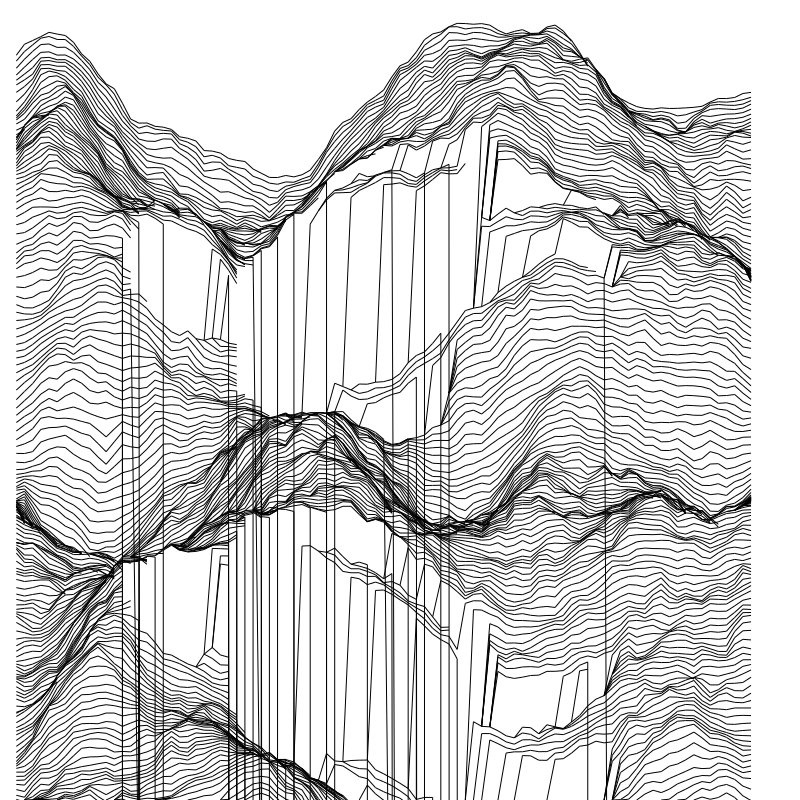

In [422]:


import drawsvg as draw
from perlin_numpy import generate_perlin_noise_3d
from scipy.interpolate import interp1d
from PIL import Image, ImageOps

im = Image.open("person.png").convert('L')
im = im.resize(np.array(np.array(im.size)*(np.ones(2)/im.size*800)[1]).astype(np.int64))
im = ImageOps.invert(im)

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[2,4,2], 
)
w,h = np.array(noise).shape[:2]
noise += np.repeat(np.array(ImageOps.pad(im, size=(w,h))),noise.shape[2]).reshape(noise.shape)
noise = (noise + 1.0) / 2.0
noise= noise **3
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[4,4,2], 
) / 5
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[8,8,2], 
) / 10
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2], 
    res=[16,16,2], 
) / 50
noise +=  generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    res=[32,32,2], 
) / 50
noise += generate_perlin_noise_3d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding), 2],  
    res=[48,48,2], 
) /50


columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y][1]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        elif points[x+1] < mins[x+1]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=mins[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

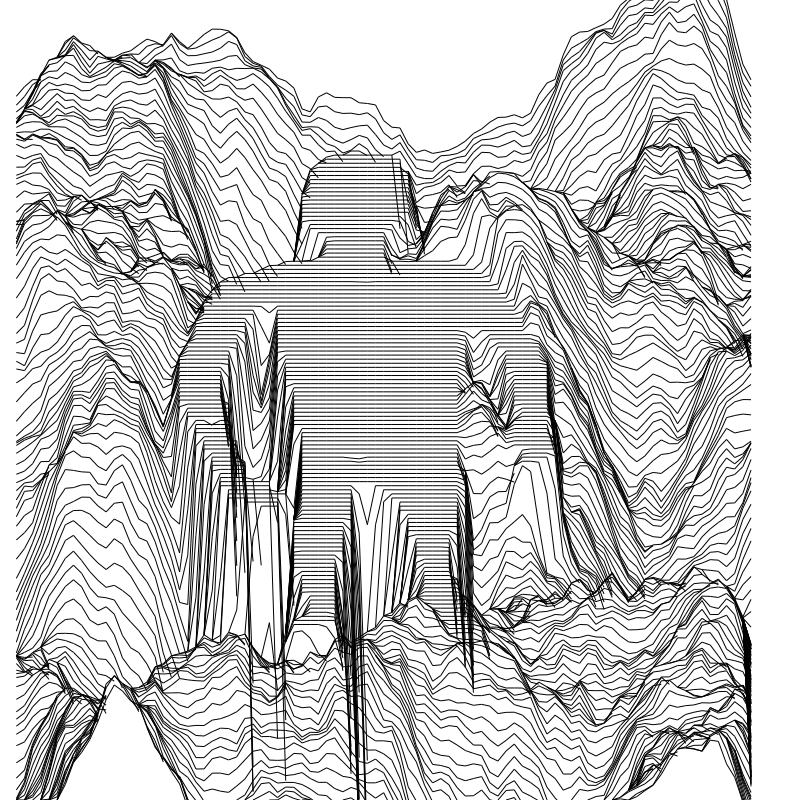

In [469]:


import drawsvg as draw
from perlin_numpy import generate_perlin_noise_2d
from scipy.interpolate import interp1d
from PIL import Image, ImageOps

im = Image.open("person.png").convert('L')
im = im.resize(np.array(np.array(im.size)*(np.ones(2)/im.size*800)[1]).astype(np.int64))
# im = ImageOps.invert(im)

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[2,4], 
)
w,h = np.array(noise).shape[:2]
noise = (noise + 1.0) / 2.0
noise= noise **3
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[4,4], 
) / 5
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[8,8], 
) / 10
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[16,16], 
) / 50
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)],  
    res=[32,32], 
) / 50
noise += generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)],  
    res=[48,48], 
) /50

padded = ImageOps.pad(im, size=(w,h), color=255)
normalized = np.array(padded)/255.
noise *= normalized.T



columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y]*noise_scaler,
        ])
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        elif points[x+1] < mins[x+1]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=mins[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d

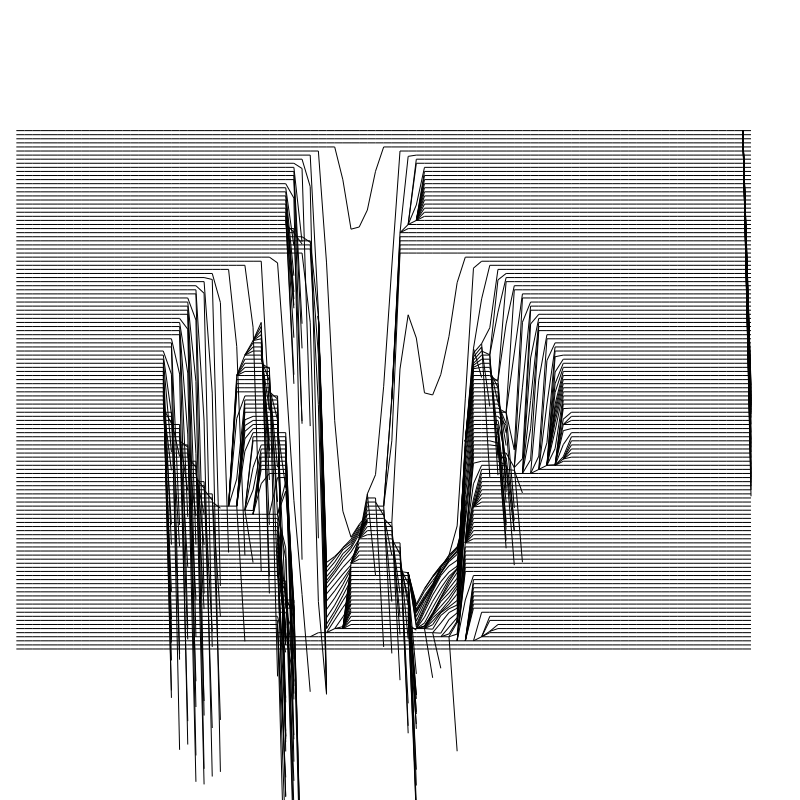

In [498]:


import drawsvg as draw
from perlin_numpy import generate_perlin_noise_2d
from scipy.interpolate import interp1d
from PIL import Image, ImageOps

im = Image.open("person.png").convert('L')
im = im.resize(np.array(np.array(im.size)*(np.ones(2)/im.size*800)[1]).astype(np.int64))
im = ImageOps.invert(im)

d = draw.Drawing(800, 800, origin='top-left', displayInline=False)

radius = 1
padding = 2
grid_divisions = 98
noise_scaler = 700.0
x_tick = d.height / grid_divisions
y_tick = d.width / (grid_divisions *2)

noise = generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[2,4], 
)
w,h = np.array(noise).shape[:2]
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[4,4], 
) / 5
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[8,8], 
) / 10
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)], 
    res=[16,16], 
) / 50
noise +=  generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)],  
    res=[32,32], 
) / 50
noise += generate_perlin_noise_2d(
    shape=[grid_divisions-padding, 2*(grid_divisions-padding)],  
    res=[48,48], 
) /50

noise = (noise + 1.0) / 2.0
# noise = noise **3
padded = ImageOps.pad(im, size=(w,h), color=255)
normalized = np.array(padded)/255.
noise *= normalized.T



columns = grid_divisions
rows = grid_divisions
mins = list([d.height for x in range(padding,columns-(2*padding)+1)])
for y in list(reversed(list(range(padding,2*(rows-padding),1)))):
    points = []
    for x in range(padding,columns-padding):
        points.extend([
            # x * x_tick,
            y * y_tick + noise[x][y]*noise_scaler,
        ])
        # if noise[x][y]<.0001:
        #     points.append(-1)
    t = np.arange(len(points))
    ti = np.linspace(0, t.max(), t.size)
    points = interp1d(t, points, kind='cubic')(ti)
    for x in range(padding,columns-(2*padding)-2):
        # print(x, columns-(2*padding)-1, len(mins))
        if points[x] == -1:
            continue
        if points[x] < mins[x]:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=points[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
            mins[x] = points[x]
        elif points[x+1] < mins[x+1] and points[x] != -1:
            d.append(draw.Line(
                sx=x * x_tick,
                # sy=y*y_tick,
                sy=mins[x],
                ex=(x+1) * x_tick,
                ey=points[x+1],
                # ey=y*y_t+1ick,
                fill='black', 
                fill_opacity=0.0,
                stroke_width=1, 
                stroke='black'
            ))
        
    # print(np.array(list(range(0,len(points),2))))
    # print(np.array(list(range(1,len(points),2))))
    # print(points[np.array(list(range(0,len(points),2)))])
#     for i, evens in enumerate(range(1,len(points),2)):
#         if points[evens] < mins[i]:
#             mins[i] = points[evens]
#         else:
#             #don't draw
#             pass
#         print(i, evens)
            

#     for i in range()
    # break

# Display in Jupyter notebook
d.rasterize()  
d